## Test a trained regressor model

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn
from resnet50 import ResNet
from resnet50 import ResNet50

from torchvision.transforms import transforms

In [2]:
val = np.load('./Data/val_honda.npz') #new_val is an augmented dataset
val_images  = val['val_images']
val_targets = val['val_targets']

In [3]:
print(val_images.shape,np.max(val_images) ,np.min(val_images))
print(val_targets.shape,np.max(val_targets) ,np.min(val_targets), np.mean(val_targets))

(10000, 3, 66, 200) 255 0
(10000,) 31.188579017264274 -31.36786188579017 -0.020944887118193874


In [4]:
# load to cpu since gpu is busy
trained_model = ResNet50()
trained_model.load_state_dict(torch.load('./Saved_models/regressor.pt',map_location=torch.device('cpu')).state_dict())

<All keys matched successfully>

## Random selection of 200 images

In [5]:
np.random.seed(42)
permutation = np.random.randint(0,val_images.shape[0], 200)

images = val_images[permutation]#/255.0 ToTensor does divide by 255? and expects C x H x W

targets = 15.0*val_targets[permutation] # multiplied by 15 to get SA

print(np.max(images), np.min(images))
print(np.max(targets), np.min(targets), np.mean(targets))

255 0
248.80478087649405 -285.4581673306774 -3.8441235059760954


In [6]:
trained_model.eval()
predictions=[]

with torch.no_grad():
    for img in images:
        inpt = torch.tensor(img).unsqueeze(0)
        outputs = trained_model(inpt) # input should be [1, 3, 66, 200]
        predictions.append(outputs.data.item())

predictions = np.array(predictions)
print("Total Predicted", predictions.shape, np.max(predictions), np.min(predictions), np.mean(predictions))

outputs = 15.0*predictions # Steering angle?
print(np.max(outputs), np.min(outputs), np.mean(outputs))

/home/b/Desktop/Regressor/env/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Total Predicted (200,) 15.6771821975708 -19.898649215698242 -0.37973512321710584
235.157732963562 -298.47973823547363 -5.696026848256588


(200, 66, 200, 3)


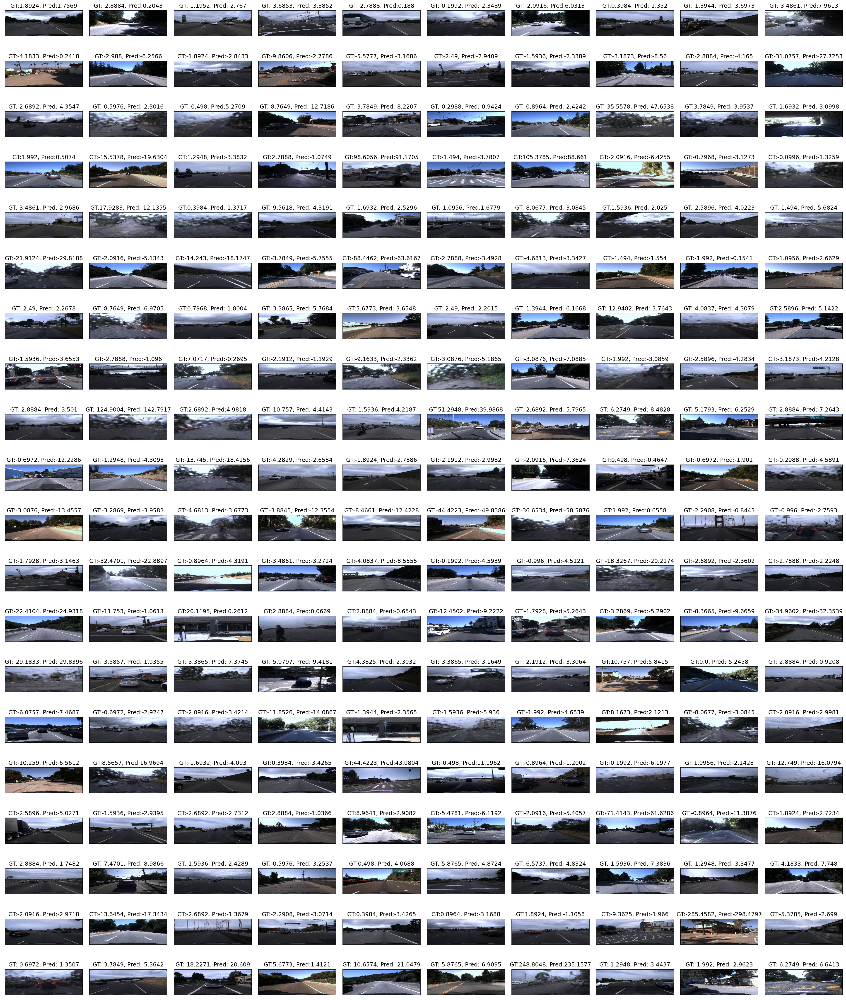

In [7]:
images = np.moveaxis(images, 1, -1)
print(images.shape)

plt_images=[]
for img in images:
    plt_images.append(Image.fromarray(np.uint8(img)).convert('RGB'))
    
fig, ax = plt.subplots(20,10, figsize=(25,30), dpi=150)
for i in range(20):
    for j in range(10):
        ind = i*10 + j
        ax[i][j].imshow(plt_images[ind]);
        ax[i][j].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        ax[i][j].set_title("GT:{}, Pred:{}".format(round(targets[ind],4),round(outputs[ind],4)))
fig.tight_layout()
plt.show()

## Sequence of images

In [8]:
# How closely is it able to track in a sequence
# Values scaled in the real scale

permutation = 7500 + np.arange(0,200,1)
images = val_images[permutation]
targets = 15.0*val_targets[permutation]

In [9]:
trained_model.eval()

predictions=[]
activations =[]

with torch.no_grad():
    for img in images:
        
        inpt = torch.tensor(img).unsqueeze(0)
        outputs = trained_model(inpt) # input should be [1, 3, 66, 200]
        predictions.append(outputs.data.item())

predictions = np.array(predictions)
print("Total Predicted", predictions.shape, np.max(predictions), np.min(predictions), np.mean(predictions))

outputs = 15.0*predictions

Total Predicted (200,) 1.1382070779800415 -5.501256942749023 -0.18708916053175925


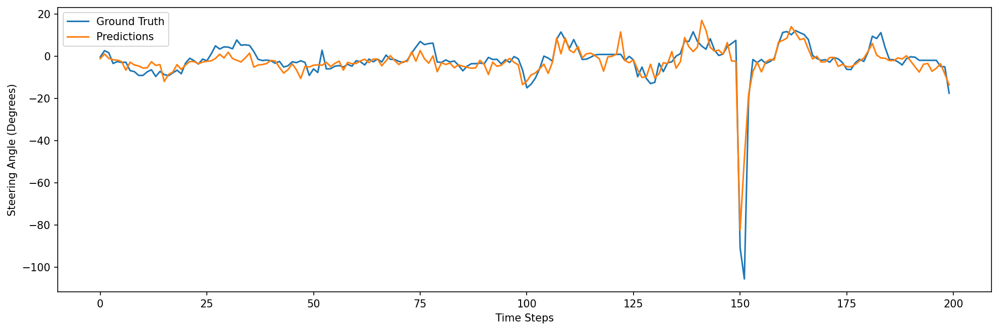

In [10]:
fig, ax = plt.subplots(figsize=(16,5), dpi =150)
ax.plot(targets) #gts
ax.plot(outputs) # preds
ax.set_ylabel("Steering Angle (Degrees)")
ax.set_xlabel("Time Steps")
ax.legend(["Ground Truth", "Predictions"])